In [52]:
using Pkg

# Activate local project environment
Pkg.activate("/g/data/v46/txs156/ClimaOcean.jl/")

# Add the global environment to the package search path
push!(LOAD_PATH, "/g/data/e14/txs156/.julia/environments/v1.10/")

using CairoMakie, IJulia, JLD2  # From global
using Oceananigans  # From local
using Statistics
using GeoMakie

  Activating project at `/g/data/v46/txs156/ClimaOcean.jl`


LoadError: ArgumentError: Package GeoMakie not found in current path.
- Run `import Pkg; Pkg.add("GeoMakie")` to install the GeoMakie package.

In [2]:
experiment_path = "/g/data/v46/txs156/ClimaOcean.jl/examples/"

"/g/data/v46/txs156/ClimaOcean.jl/examples/"

## Surface $1/4^\circ$ analysis

In [4]:
u_surf_1_4_deg = FieldTimeSeries(experiment_path*"near_global_surface_fields.jld2", "u"; backend = OnDisk())
v_surf_1_4_deg = FieldTimeSeries(experiment_path*"near_global_surface_fields.jld2", "v"; backend = OnDisk())
T_surf_1_4_deg = FieldTimeSeries(experiment_path*"near_global_surface_fields.jld2", "T"; backend = OnDisk())
e_surf_1_4_deg = FieldTimeSeries(experiment_path*"near_global_surface_fields.jld2", "e"; backend = OnDisk())

1440×600×1×43 FieldTimeSeries{OnDisk} located at (Center, Center, Center) of e at /g/data/v46/txs156/ClimaOcean.jl/examples/near_global_surface_fields.jld2
├── grid: 1440×600×40 ImmersedBoundaryGrid{Float64, Periodic, Bounded, Bounded} on CPU with 7×7×7 halo
├── indices: (:, :, 40:40)
├── time_indexing: Linear()
├── backend: OnDisk
├── path: /g/data/v46/txs156/ClimaOcean.jl/examples/near_global_surface_fields.jld2
└── name: e

In [5]:
times = u_surf_1_4_deg.times
Nt = length(times)

n = Observable(Nt)

land = interior(T_surf_1_4_deg.grid.immersed_boundary.bottom_height) .>= 0

1440×600×1 BitArray{3}:
[:, :, 1] =
 1  1  1  1  1  1  1  1  1  1  1  1  1  …  0  0  0  0  0  0  0  0  0  0  0  0
 1  1  1  1  1  1  1  1  1  1  1  1  1     0  0  0  0  0  0  0  0  0  0  0  0
 1  1  1  1  1  1  1  1  1  1  1  1  1     0  0  0  0  0  0  0  0  0  0  0  0
 1  1  1  1  1  1  1  1  1  1  1  1  1     0  0  0  0  0  0  0  0  0  0  0  0
 1  1  1  1  1  1  1  1  1  1  1  1  1     0  0  0  0  0  0  0  0  0  0  0  0
 1  1  1  1  1  1  1  1  1  1  1  1  1  …  0  0  0  0  0  0  0  0  0  0  0  0
 1  1  1  1  1  1  1  1  1  1  1  1  1     0  0  0  0  0  0  0  0  0  0  0  0
 1  1  1  1  1  1  1  1  1  1  1  1  1     0  0  0  0  0  0  0  0  0  0  0  0
 1  1  1  1  1  1  1  1  1  1  1  1  1     0  0  0  0  0  0  0  0  0  0  0  0
 1  1  1  1  1  1  1  1  1  1  1  1  1     0  0  0  0  0  0  0  0  0  0  0  0
 1  1  1  1  1  1  1  1  1  1  1  1  1  …  0  0  0  0  0  0  0  0  0  0  0  0
 1  1  1  1  1  1  1  1  1  1  1  1  1     0  0  0  0  0  0  0  0  0  0  0  0
 1  1  1  1  1  1  1  1  1  

In [6]:
#### Try a South Polar Stereo Projection! 

# using Proj4

# # Define the South Polar Stereographic projection (EPSG:3031 is for the Southern Polar Stereographic projection)
# proj = Proj4.Proj("+proj=stere +lat_0=-90 +lon_0=0 +lat_ts=-90 +x_0=0 +y_0=0 +datum=WGS84")

# # Define the coordinates to plot (e.g., a grid of latitudes and longitudes)
# latitudes = -90:1:-60  # Latitude from -90 to -60
# longitudes = 0:1:360  # Longitude from 0 to 360

# # Convert the latitudes and longitudes to x, y using the projection
# x, y = Proj4.transform(proj, longitudes, latitudes)


In [7]:
Tn = @lift begin
    Tn = interior(T_surf_1_4_deg[$n])
    Tn[land] .= NaN
    view(Tn, :, :, 1)
end

en = @lift begin
    en = interior(e_surf_1_4_deg[$n])
    en[land] .= NaN
    view(en, :, :, 1)
end

Observable(Float32[NaN NaN … 0.000105596075 0.00015630847; NaN NaN … 0.0001057976 0.00017443483; … ; NaN NaN … 0.00011609013 0.00017500474; NaN NaN … 0.00010925727 0.00016949179])


In [8]:
un = Field{Face, Center, Nothing}(u_surf_1_4_deg.grid)
vn = Field{Center, Face, Nothing}(v_surf_1_4_deg.grid)

s = @at (Center, Center, Nothing) sqrt(un^2 + vn^2) # compute √(u²+v²) and interpolate back to Center, Center
s = Field(s)

sn = @lift begin
    parent(un) .= parent(u_surf_1_4_deg[$n])
    parent(vn) .= parent(v_surf_1_4_deg[$n])
    compute!(s)
    sn = interior(s)
    sn[land] .= NaN
    view(sn, :, :, 1)
end

Observable([NaN NaN … 0.11508871626039291 0.03966243167374361; NaN NaN … 0.11089240018068473 0.0370962537858079; … ; NaN NaN … 0.12249449064243752 0.04328649602795753; NaN NaN … 0.12075542631111995 0.04219085854838686])


In [23]:
title = @lift string("Near-global 1/4 degree ocean simulation after ",
                     prettytime(times[$n] - times[1]))

λ, φ, _ = nodes(T_surf_1_4_deg) # T, e, and s all live on the same grid locations


([0.125, 0.375, 0.625, 0.875, 1.125, 1.375, 1.625, 1.875, 2.125, 2.375  …  357.625, 357.875, 358.125, 358.375, 358.625, 358.875, 359.125, 359.375, 359.625, 359.875], [-74.875, -74.625, -74.375, -74.125, -73.875, -73.625, -73.375, -73.125, -72.875, -72.625  …  72.625, 72.875, 73.125, 73.375, 73.625, 73.875, 74.125, 74.375, 74.625, 74.875], [-5677.206125288814, -5065.964500472836, -4519.760606094977, -4031.6742550985828, -3595.521586688331, -3205.776719262629, -2857.501739681861, -2546.2841418642147, -2268.180922080881, -2019.6686226601569  …  -129.16695014662875, -108.2514119116606, -89.56134243154631, -72.85994592684236, -57.93562231723149, -44.59928633229423, -32.681971876006436, -22.03269129320971, -12.516522415808335, -4.012899152325841])

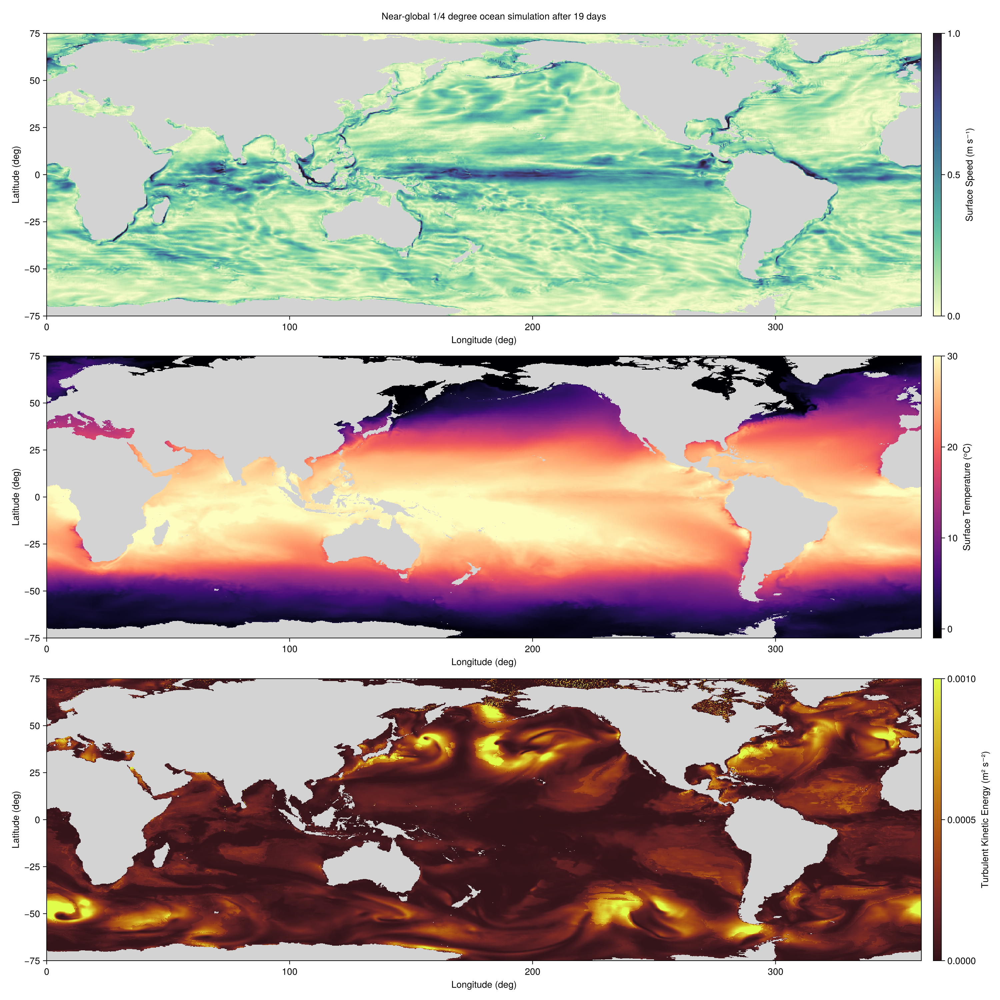

CairoMakie.Screen{IMAGE}


In [24]:
ybounds = nothing#(minimum(φ), -50)

fig = Figure(size = (1500, 1500))

axs = Axis(fig[1, 1], xlabel="Longitude (deg)", ylabel="Latitude (deg)")
axT = Axis(fig[2, 1], xlabel="Longitude (deg)", ylabel="Latitude (deg)")
axe = Axis(fig[3, 1], xlabel="Longitude (deg)", ylabel="Latitude (deg)")

hm = heatmap!(axs, λ, φ, sn, colorrange = (0, 1), colormap = :deep, nan_color=:lightgray)
Colorbar(fig[1, 2], hm, label = "Surface Speed (m s⁻¹)")

hm = heatmap!(axT, λ, φ, Tn, colorrange = (-1, 30), colormap = :magma, nan_color=:lightgray)
Colorbar(fig[2, 2], hm, label = "Surface Temperature (ᵒC)")

hm = heatmap!(axe, λ, φ, en, colorrange = (0, 1e-3), colormap = :solar, nan_color=:lightgray)
Colorbar(fig[3, 2], hm, label = "Turbulent Kinetic Energy (m² s⁻²)")

axs.limits = (nothing, ybounds) 
axT.limits = (nothing, ybounds) 
axe.limits = (nothing, ybounds)

Label(fig[0, :], title)
display(fig)

In [25]:
record(fig, experiment_path*"videos/near_global_ocean_surface.mp4", 1:Nt, framerate = 8) do nn
    n[] = nn
end

"/g/data/v46/txs156/ClimaOcean.jl/examples/videos/near_global_ocean_surface.mp4"

In [26]:
φ_target = -59
φ_ind = argmin(abs.(φ .-φ_target))

64

In [27]:
sn_line = @lift begin
    parent(un) .= parent(u_surf_1_4_deg[$n])
    parent(vn) .= parent(v_surf_1_4_deg[$n])
    compute!(s)
    sn_line = interior(s)
    sn_line[land] .= NaN
    view(sn_line, :, φ_ind, 1)
end

Tn_line = @lift begin
    Tn_line = interior(T_surf_1_4_deg[$n])
    Tn_line[land] .= NaN
    view(Tn_line, :, φ_ind, 1)
end

en_line = @lift begin
    en_line = interior(e_surf_1_4_deg[$n])
    en_line[land] .= NaN
    view(en_line, :, φ_ind, 1)
end

Observable(Float32[0.00018224004, 0.00017946481, 0.00018393372, 0.00018312546, 0.00019384908, 0.00021588393, 0.00023196064, 0.00021902363, 0.000230097, 0.00016000087  …  0.00011310282, 0.00010882262, 0.00011264954, 0.00011891655, 0.00012916549, 0.0001387727, 0.0001375142, 0.00015750111, 0.00016815284, 0.00017516386])


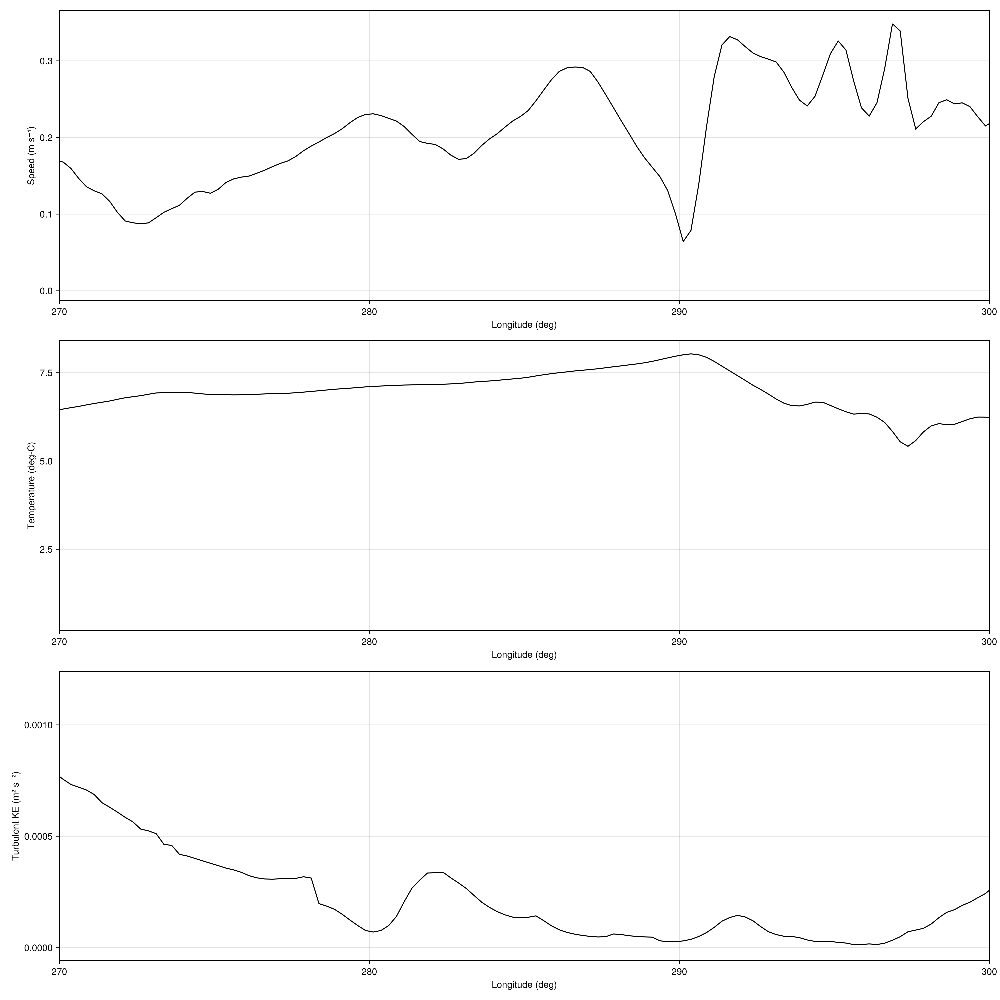

CairoMakie.Screen{IMAGE}


In [28]:
xbounds = (270,300)

fig2 = Figure(size = (1500, 1500))

axs = Axis(fig2[1, 1], xlabel="Longitude (deg)", ylabel="Speed (m s⁻¹)")
axT = Axis(fig2[2, 1], xlabel="Longitude (deg)", ylabel="Temperature (deg-C)")
axe = Axis(fig2[3, 1], xlabel="Longitude (deg)", ylabel="Turbulent KE (m² s⁻²)")

hm = lines!(axs, λ, sn_line, color="black")
hm = lines!(axT, λ, Tn_line, color="black")
hm = lines!(axe, λ, en_line, color="black")

axs.limits = (xbounds, nothing)
axT.limits = (xbounds, nothing)
axe.limits = (xbounds, nothing)

display(fig2)

In [29]:
record(fig2, experiment_path*"videos/near_global_ocean_surface_lines.mp4", 1:Nt, framerate = 8) do nn
    n[] = nn
end

"/g/data/v46/txs156/ClimaOcean.jl/examples/videos/near_global_ocean_surface_lines.mp4"

## 3D $1^\circ$ analysis

In [3]:
# using OnDisk enables lazy loading, so everything is done via the @lift macro
u_3d_1_deg = FieldTimeSeries(experiment_path*"near_global_3D_fields_old.jld2", "u")#; backend = OnDisk())
v_3d_1_deg = FieldTimeSeries(experiment_path*"near_global_3D_fields_old.jld2", "v")#; backend = OnDisk())
T_3d_1_deg = FieldTimeSeries(experiment_path*"near_global_3D_fields_old.jld2", "T")#; backend = OnDisk())
e_3d_1_deg = FieldTimeSeries(experiment_path*"near_global_3D_fields_old.jld2", "e")#; backend = OnDisk())
S_3d_1_deg = FieldTimeSeries(experiment_path*"near_global_3D_fields_old.jld2", "S")#; backend = OnDisk())


360×150×40×100 FieldTimeSeries{InMemory} located at (Center, Center, Center) of S at /g/data/v46/txs156/ClimaOcean.jl/examples/near_global_3D_fields_old.jld2
├── grid: 360×150×40 ImmersedBoundaryGrid{Float64, Periodic, Bounded, Bounded} on CPU with 7×7×7 halo
├── indices: (:, :, :)
├── time_indexing: Linear()
├── backend: InMemory()
├── path: /g/data/v46/txs156/ClimaOcean.jl/examples/near_global_3D_fields_old.jld2
├── name: S
└── data: 374×164×54×100 OffsetArray(::Array{Float64, 4}, -6:367, -6:157, -6:47, 1:100) with eltype Float64 with indices -6:367×-6:157×-6:47×1:100
    └── max=40.2488, min=0.0, mean=13.9772

In [4]:
times = u_3d_1_deg.times
Nt = length(times)
λ, φ, z = nodes(T_3d_1_deg)
n = Observable(Nt)

Observable(100)


In [45]:
s = @at (Center, Center, Center) sqrt(u_3d_1_deg^2+v_3d_1_deg^2)
s = Field(s)


360×150×40 Field{Center, Center, Center} on ImmersedBoundaryGrid on CPU
├── grid: 360×150×40 ImmersedBoundaryGrid{Float64, Periodic, Bounded, Bounded} on CPU with 7×7×7 halo
├── boundary conditions: FieldBoundaryConditions
│   └── west: Periodic, east: Periodic, south: ZeroFlux, north: ZeroFlux, bottom: ZeroFlux, top: ZeroFlux, immersed: ZeroFlux
├── operand: UnaryOperation at (Center, Center, Center)
├── status: time=0.0
└── data: 374×164×54 OffsetArray(::Array{Float64, 3}, -6:367, -6:157, -6:47) with eltype Float64 with indices -6:367×-6:157×-6:47
    └── max=0.0, min=0.0, mean=0.0

In [32]:
a = compute!(s)
a

360×150×40 Field{Center, Center, Center} on ImmersedBoundaryGrid on CPU
├── grid: 360×150×40 ImmersedBoundaryGrid{Float64, Periodic, Bounded, Bounded} on CPU with 7×7×7 halo
├── boundary conditions: FieldBoundaryConditions
│   └── west: Periodic, east: Periodic, south: ZeroFlux, north: ZeroFlux, bottom: ZeroFlux, top: ZeroFlux, immersed: ZeroFlux
├── operand: UnaryOperation at (Center, Center, Center)
├── status: time=0.0
└── data: 374×164×54 OffsetArray(::Array{Float64, 3}, -6:367, -6:157, -6:47) with eltype Float64 with indices -6:367×-6:157×-6:47
    └── max=0.0, min=0.0, mean=0.0

In [35]:
s_average = Average(a, dims=(1, 2, 3))

Average of ConditionalOperation of BinaryOperation at (Center, Center, Center) with condition (::Oceananigans.ImmersedBoundaries.NotImmersed{typeof(Oceananigans.ImmersedBoundaries.truefunc)}) (generic function with 0 methods) over dims (1, 2, 3)
└── operand: ConditionalOperation of BinaryOperation at (Center, Center, Center) with condition (::Oceananigans.ImmersedBoundaries.NotImmersed{typeof(Oceananigans.ImmersedBoundaries.truefunc)}) (generic function with 0 methods)
    └── grid: 360×150×40 ImmersedBoundaryGrid{Float64, Periodic, Bounded, Bounded} on CPU with 7×7×7 halo

In [ ]:
T_average = view(mean(mean(mean(interior(T_3d_1_deg), dims=1), dims=2), dims=3), 1,1,1, :)
Salt_average = view(mean(mean(mean(interior(S_3d_1_deg), dims=1), dims=2), dims=3), 1,1,1, :)


In [51]:
compute!(Average(u_3d_1_deg^2, dims=(1, 2, 3)))

Average of ConditionalOperation of BinaryOperation at (Face, Center, Center) with condition (::Oceananigans.ImmersedBoundaries.NotImmersed{typeof(Oceananigans.ImmersedBoundaries.truefunc)}) (generic function with 0 methods) over dims (1, 2, 3)
└── operand: ConditionalOperation of BinaryOperation at (Face, Center, Center) with condition (::Oceananigans.ImmersedBoundaries.NotImmersed{typeof(Oceananigans.ImmersedBoundaries.truefunc)}) (generic function with 0 methods)
    └── grid: 360×150×40 ImmersedBoundaryGrid{Float64, Periodic, Bounded, Bounded} on CPU with 7×7×7 halo

In [38]:
prettytime.(times)

100-element Vector{String}:
 "0 seconds"
 "1 day"
 "2 days"
 "3 days"
 "4 days"
 "5 days"
 "6 days"
 "7 days"
 "8 days"
 "9 days"
 "10 days"
 "11 days"
 "12 days"
 ⋮
 "88 days"
 "89 days"
 "90 days"
 "91 days"
 "92 days"
 "93 days"
 "94 days"
 "95 days"
 "96 days"
 "97 days"
 "98 days"
 "99 days"

In [42]:
s_average

Average of ConditionalOperation of BinaryOperation at (Center, Center, Center) with condition (::Oceananigans.ImmersedBoundaries.NotImmersed{typeof(Oceananigans.ImmersedBoundaries.truefunc)}) (generic function with 0 methods) over dims (1, 2, 3)
└── operand: ConditionalOperation of BinaryOperation at (Center, Center, Center) with condition (::Oceananigans.ImmersedBoundaries.NotImmersed{typeof(Oceananigans.ImmersedBoundaries.truefunc)}) (generic function with 0 methods)
    └── grid: 360×150×40 ImmersedBoundaryGrid{Float64, Periodic, Bounded, Bounded} on CPU with 7×7×7 halo

In [43]:
using Oceananigans.Units

# # Now, plot average props over time
fig = Figure()
axT = Axis(fig[1, 1], xlabel="Time", ylabel="Average\nTemperature")
axS = Axis(fig[2, 1], xlabel="Time", ylabel="Average\nSalinity")
axSp = Axis(fig[3, 1], xlabel="Time", ylabel="Average\nSpeed")

lines!(axT, times / day, T_average)
lines!(axS, times / day, Salt_average)
lines!(axSp, times / day, s_average)
display(fig)

LoadError: ArgumentError:     Conversion failed for Lines (With conversion trait PointBased()) with args: Tuple{StepRangeLen{Float64, Base.TwicePrecision{Float64}, Base.TwicePrecision{Float64}, Int64}, Reduction{Oceananigans.AbstractOperations.Averaging, typeof(sum!), Oceananigans.AbstractOperations.ConditionalOperation{Center, Center, Center, Oceananigans.AbstractOperations.BinaryOperation{Center, Center, Center, typeof(/), Oceananigans.AbstractOperations.BinaryOperation{Center, Center, Center, typeof(*), Field{Center, Center, Center, Oceananigans.AbstractOperations.UnaryOperation{Center, Center, Center, typeof(sqrt), Oceananigans.AbstractOperations.BinaryOperation{Center, Center, Center, typeof(+), Oceananigans.AbstractOperations.BinaryOperation{Face, Center, Center, typeof(^), Field{Face, Center, Center, Nothing, ImmersedBoundaryGrid{Float64, Periodic, Bounded, Bounded, LatitudeLongitudeGrid{Float64, Periodic, Bounded, Bounded, Oceananigans.Grids.StaticVerticalDiscretization{OffsetArrays.OffsetVector{Float64, Vector{Float64}}, OffsetArrays.OffsetVector{Float64, Vector{Float64}}, OffsetArrays.OffsetVector{Float64, Vector{Float64}}, OffsetArrays.OffsetVector{Float64, Vector{Float64}}}, OffsetArrays.OffsetVector{Float64, Vector{Float64}}, Float64, Float64, Float64, OffsetArrays.OffsetVector{Float64, StepRangeLen{Float64, Base.TwicePrecision{Float64}, Base.TwicePrecision{Float64}, Int64}}, OffsetArrays.OffsetVector{Float64, StepRangeLen{Float64, Base.TwicePrecision{Float64}, Base.TwicePrecision{Float64}, Int64}}, CPU}, GridFittedBottom{Field{Center, Center, Nothing, Nothing, LatitudeLongitudeGrid{Float64, Periodic, Bounded, Bounded, Oceananigans.Grids.StaticVerticalDiscretization{OffsetArrays.OffsetVector{Float64, Vector{Float64}}, OffsetArrays.OffsetVector{Float64, Vector{Float64}}, OffsetArrays.OffsetVector{Float64, Vector{Float64}}, OffsetArrays.OffsetVector{Float64, Vector{Float64}}}, OffsetArrays.OffsetVector{Float64, Vector{Float64}}, Float64, Float64, Float64, OffsetArrays.OffsetVector{Float64, StepRangeLen{Float64, Base.TwicePrecision{Float64}, Base.TwicePrecision{Float64}, Int64}}, OffsetArrays.OffsetVector{Float64, StepRangeLen{Float64, Base.TwicePrecision{Float64}, Base.TwicePrecision{Float64}, Int64}}, CPU}, Tuple{Colon, Colon, Colon}, OffsetArrays.OffsetArray{Float64, 3, Array{Float64, 3}}, Float64, FieldBoundaryConditions{BoundaryCondition{Oceananigans.BoundaryConditions.Periodic, Nothing}, BoundaryCondition{Oceananigans.BoundaryConditions.Periodic, Nothing}, BoundaryCondition{Oceananigans.BoundaryConditions.Flux, Nothing}, BoundaryCondition{Oceananigans.BoundaryConditions.Flux, Nothing}, Nothing, Nothing, BoundaryCondition{Oceananigans.BoundaryConditions.Flux, Nothing}}, Nothing, Oceananigans.Fields.FieldBoundaryBuffers{Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, Nothing}}, Oceananigans.ImmersedBoundaries.CenterImmersedCondition}, Nothing, Nothing, CPU}, Tuple{Colon, Colon, Colon}, OffsetArrays.OffsetArray{Float64, 3, SubArray{Float64, 3, Array{Float64, 4}, Tuple{Base.Slice{Base.OneTo{Int64}}, Base.Slice{Base.OneTo{Int64}}, Base.Slice{Base.OneTo{Int64}}, Int64}, true}}, Float64, Missing, Nothing, Nothing}, Int64, typeof(Oceananigans.Operators.identity1), typeof(Oceananigans.Operators.identity2), ImmersedBoundaryGrid{Float64, Periodic, Bounded, Bounded, LatitudeLongitudeGrid{Float64, Periodic, Bounded, Bounded, Oceananigans.Grids.StaticVerticalDiscretization{OffsetArrays.OffsetVector{Float64, Vector{Float64}}, OffsetArrays.OffsetVector{Float64, Vector{Float64}}, OffsetArrays.OffsetVector{Float64, Vector{Float64}}, OffsetArrays.OffsetVector{Float64, Vector{Float64}}}, OffsetArrays.OffsetVector{Float64, Vector{Float64}}, Float64, Float64, Float64, OffsetArrays.OffsetVector{Float64, StepRangeLen{Float64, Base.TwicePrecision{Float64}, Base.TwicePrecision{Float64}, Int64}}, OffsetArrays.OffsetVector{Float64, StepRangeLen{Float64, Base.TwicePrecision{Float64}, Base.TwicePrecision{Float64}, Int64}}, CPU}, GridFittedBottom{Field{Center, Center, Nothing, Nothing, LatitudeLongitudeGrid{Float64, Periodic, Bounded, Bounded, Oceananigans.Grids.StaticVerticalDiscretization{OffsetArrays.OffsetVector{Float64, Vector{Float64}}, OffsetArrays.OffsetVector{Float64, Vector{Float64}}, OffsetArrays.OffsetVector{Float64, Vector{Float64}}, OffsetArrays.OffsetVector{Float64, Vector{Float64}}}, OffsetArrays.OffsetVector{Float64, Vector{Float64}}, Float64, Float64, Float64, OffsetArrays.OffsetVector{Float64, StepRangeLen{Float64, Base.TwicePrecision{Float64}, Base.TwicePrecision{Float64}, Int64}}, OffsetArrays.OffsetVector{Float64, StepRangeLen{Float64, Base.TwicePrecision{Float64}, Base.TwicePrecision{Float64}, Int64}}, CPU}, Tuple{Colon, Colon, Colon}, OffsetArrays.OffsetArray{Float64, 3, Array{Float64, 3}}, Float64, FieldBoundaryConditions{BoundaryCondition{Oceananigans.BoundaryConditions.Periodic, Nothing}, BoundaryCondition{Oceananigans.BoundaryConditions.Periodic, Nothing}, BoundaryCondition{Oceananigans.BoundaryConditions.Flux, Nothing}, BoundaryCondition{Oceananigans.BoundaryConditions.Flux, Nothing}, Nothing, Nothing, BoundaryCondition{Oceananigans.BoundaryConditions.Flux, Nothing}}, Nothing, Oceananigans.Fields.FieldBoundaryBuffers{Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, Nothing}}, Oceananigans.ImmersedBoundaries.CenterImmersedCondition}, Nothing, Nothing, CPU}, Float64}, Oceananigans.AbstractOperations.BinaryOperation{Center, Face, Center, typeof(^), Field{Center, Face, Center, Nothing, ImmersedBoundaryGrid{Float64, Periodic, Bounded, Bounded, LatitudeLongitudeGrid{Float64, Periodic, Bounded, Bounded, Oceananigans.Grids.StaticVerticalDiscretization{OffsetArrays.OffsetVector{Float64, Vector{Float64}}, OffsetArrays.OffsetVector{Float64, Vector{Float64}}, OffsetArrays.OffsetVector{Float64, Vector{Float64}}, OffsetArrays.OffsetVector{Float64, Vector{Float64}}}, OffsetArrays.OffsetVector{Float64, Vector{Float64}}, Float64, Float64, Float64, OffsetArrays.OffsetVector{Float64, StepRangeLen{Float64, Base.TwicePrecision{Float64}, Base.TwicePrecision{Float64}, Int64}}, OffsetArrays.OffsetVector{Float64, StepRangeLen{Float64, Base.TwicePrecision{Float64}, Base.TwicePrecision{Float64}, Int64}}, CPU}, GridFittedBottom{Field{Center, Center, Nothing, Nothing, LatitudeLongitudeGrid{Float64, Periodic, Bounded, Bounded, Oceananigans.Grids.StaticVerticalDiscretization{OffsetArrays.OffsetVector{Float64, Vector{Float64}}, OffsetArrays.OffsetVector{Float64, Vector{Float64}}, OffsetArrays.OffsetVector{Float64, Vector{Float64}}, OffsetArrays.OffsetVector{Float64, Vector{Float64}}}, OffsetArrays.OffsetVector{Float64, Vector{Float64}}, Float64, Float64, Float64, OffsetArrays.OffsetVector{Float64, StepRangeLen{Float64, Base.TwicePrecision{Float64}, Base.TwicePrecision{Float64}, Int64}}, OffsetArrays.OffsetVector{Float64, StepRangeLen{Float64, Base.TwicePrecision{Float64}, Base.TwicePrecision{Float64}, Int64}}, CPU}, Tuple{Colon, Colon, Colon}, OffsetArrays.OffsetArray{Float64, 3, Array{Float64, 3}}, Float64, FieldBoundaryConditions{BoundaryCondition{Oceananigans.BoundaryConditions.Periodic, Nothing}, BoundaryCondition{Oceananigans.BoundaryConditions.Periodic, Nothing}, BoundaryCondition{Oceananigans.BoundaryConditions.Flux, Nothing}, BoundaryCondition{Oceananigans.BoundaryConditions.Flux, Nothing}, Nothing, Nothing, BoundaryCondition{Oceananigans.BoundaryConditions.Flux, Nothing}}, Nothing, Oceananigans.Fields.FieldBoundaryBuffers{Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, Nothing}}, Oceananigans.ImmersedBoundaries.CenterImmersedCondition}, Nothing, Nothing, CPU}, Tuple{Colon, Colon, Colon}, OffsetArrays.OffsetArray{Float64, 3, SubArray{Float64, 3, Array{Float64, 4}, Tuple{Base.Slice{Base.OneTo{Int64}}, Base.Slice{Base.OneTo{Int64}}, Base.Slice{Base.OneTo{Int64}}, Int64}, true}}, Float64, Missing, Nothing, Nothing}, Int64, typeof(Oceananigans.Operators.identity3), typeof(Oceananigans.Operators.identity4), ImmersedBoundaryGrid{Float64, Periodic, Bounded, Bounded, LatitudeLongitudeGrid{Float64, Periodic, Bounded, Bounded, Oceananigans.Grids.StaticVerticalDiscretization{OffsetArrays.OffsetVector{Float64, Vector{Float64}}, OffsetArrays.OffsetVector{Float64, Vector{Float64}}, OffsetArrays.OffsetVector{Float64, Vector{Float64}}, OffsetArrays.OffsetVector{Float64, Vector{Float64}}}, OffsetArrays.OffsetVector{Float64, Vector{Float64}}, Float64, Float64, Float64, OffsetArrays.OffsetVector{Float64, StepRangeLen{Float64, Base.TwicePrecision{Float64}, Base.TwicePrecision{Float64}, Int64}}, OffsetArrays.OffsetVector{Float64, StepRangeLen{Float64, Base.TwicePrecision{Float64}, Base.TwicePrecision{Float64}, Int64}}, CPU}, GridFittedBottom{Field{Center, Center, Nothing, Nothing, LatitudeLongitudeGrid{Float64, Periodic, Bounded, Bounded, Oceananigans.Grids.StaticVerticalDiscretization{OffsetArrays.OffsetVector{Float64, Vector{Float64}}, OffsetArrays.OffsetVector{Float64, Vector{Float64}}, OffsetArrays.OffsetVector{Float64, Vector{Float64}}, OffsetArrays.OffsetVector{Float64, Vector{Float64}}}, OffsetArrays.OffsetVector{Float64, Vector{Float64}}, Float64, Float64, Float64, OffsetArrays.OffsetVector{Float64, StepRangeLen{Float64, Base.TwicePrecision{Float64}, Base.TwicePrecision{Float64}, Int64}}, OffsetArrays.OffsetVector{Float64, StepRangeLen{Float64, Base.TwicePrecision{Float64}, Base.TwicePrecision{Float64}, Int64}}, CPU}, Tuple{Colon, Colon, Colon}, OffsetArrays.OffsetArray{Float64, 3, Array{Float64, 3}}, Float64, FieldBoundaryConditions{BoundaryCondition{Oceananigans.BoundaryConditions.Periodic, Nothing}, BoundaryCondition{Oceananigans.BoundaryConditions.Periodic, Nothing}, BoundaryCondition{Oceananigans.BoundaryConditions.Flux, Nothing}, BoundaryCondition{Oceananigans.BoundaryConditions.Flux, Nothing}, Nothing, Nothing, BoundaryCondition{Oceananigans.BoundaryConditions.Flux, Nothing}}, Nothing, Oceananigans.Fields.FieldBoundaryBuffers{Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, Nothing}}, Oceananigans.ImmersedBoundaries.CenterImmersedCondition}, Nothing, Nothing, CPU}, Float64}, typeof(Oceananigans.Operators.ℑxᶜᵃᵃ), typeof(Oceananigans.Operators.ℑyᵃᶜᵃ), ImmersedBoundaryGrid{Float64, Periodic, Bounded, Bounded, LatitudeLongitudeGrid{Float64, Periodic, Bounded, Bounded, Oceananigans.Grids.StaticVerticalDiscretization{OffsetArrays.OffsetVector{Float64, Vector{Float64}}, OffsetArrays.OffsetVector{Float64, Vector{Float64}}, OffsetArrays.OffsetVector{Float64, Vector{Float64}}, OffsetArrays.OffsetVector{Float64, Vector{Float64}}}, OffsetArrays.OffsetVector{Float64, Vector{Float64}}, Float64, Float64, Float64, OffsetArrays.OffsetVector{Float64, StepRangeLen{Float64, Base.TwicePrecision{Float64}, Base.TwicePrecision{Float64}, Int64}}, OffsetArrays.OffsetVector{Float64, StepRangeLen{Float64, Base.TwicePrecision{Float64}, Base.TwicePrecision{Float64}, Int64}}, CPU}, GridFittedBottom{Field{Center, Center, Nothing, Nothing, LatitudeLongitudeGrid{Float64, Periodic, Bounded, Bounded, Oceananigans.Grids.StaticVerticalDiscretization{OffsetArrays.OffsetVector{Float64, Vector{Float64}}, OffsetArrays.OffsetVector{Float64, Vector{Float64}}, OffsetArrays.OffsetVector{Float64, Vector{Float64}}, OffsetArrays.OffsetVector{Float64, Vector{Float64}}}, OffsetArrays.OffsetVector{Float64, Vector{Float64}}, Float64, Float64, Float64, OffsetArrays.OffsetVector{Float64, StepRangeLen{Float64, Base.TwicePrecision{Float64}, Base.TwicePrecision{Float64}, Int64}}, OffsetArrays.OffsetVector{Float64, StepRangeLen{Float64, Base.TwicePrecision{Float64}, Base.TwicePrecision{Float64}, Int64}}, CPU}, Tuple{Colon, Colon, Colon}, OffsetArrays.OffsetArray{Float64, 3, Array{Float64, 3}}, Float64, FieldBoundaryConditions{BoundaryCondition{Oceananigans.BoundaryConditions.Periodic, Nothing}, BoundaryCondition{Oceananigans.BoundaryConditions.Periodic, Nothing}, BoundaryCondition{Oceananigans.BoundaryConditions.Flux, Nothing}, BoundaryCondition{Oceananigans.BoundaryConditions.Flux, Nothing}, Nothing, Nothing, BoundaryCondition{Oceananigans.BoundaryConditions.Flux, Nothing}}, Nothing, Oceananigans.Fields.FieldBoundaryBuffers{Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, Nothing}}, Oceananigans.ImmersedBoundaries.CenterImmersedCondition}, Nothing, Nothing, CPU}, Float64}, typeof(Oceananigans.Operators.identity5), ImmersedBoundaryGrid{Float64, Periodic, Bounded, Bounded, LatitudeLongitudeGrid{Float64, Periodic, Bounded, Bounded, Oceananigans.Grids.StaticVerticalDiscretization{OffsetArrays.OffsetVector{Float64, Vector{Float64}}, OffsetArrays.OffsetVector{Float64, Vector{Float64}}, OffsetArrays.OffsetVector{Float64, Vector{Float64}}, OffsetArrays.OffsetVector{Float64, Vector{Float64}}}, OffsetArrays.OffsetVector{Float64, Vector{Float64}}, Float64, Float64, Float64, OffsetArrays.OffsetVector{Float64, StepRangeLen{Float64, Base.TwicePrecision{Float64}, Base.TwicePrecision{Float64}, Int64}}, OffsetArrays.OffsetVector{Float64, StepRangeLen{Float64, Base.TwicePrecision{Float64}, Base.TwicePrecision{Float64}, Int64}}, CPU}, GridFittedBottom{Field{Center, Center, Nothing, Nothing, LatitudeLongitudeGrid{Float64, Periodic, Bounded, Bounded, Oceananigans.Grids.StaticVerticalDiscretization{OffsetArrays.OffsetVector{Float64, Vector{Float64}}, OffsetArrays.OffsetVector{Float64, Vector{Float64}}, OffsetArrays.OffsetVector{Float64, Vector{Float64}}, OffsetArrays.OffsetVector{Float64, Vector{Float64}}}, OffsetArrays.OffsetVector{Float64, Vector{Float64}}, Float64, Float64, Float64, OffsetArrays.OffsetVector{Float64, StepRangeLen{Float64, Base.TwicePrecision{Float64}, Base.TwicePrecision{Float64}, Int64}}, OffsetArrays.OffsetVector{Float64, StepRangeLen{Float64, Base.TwicePrecision{Float64}, Base.TwicePrecision{Float64}, Int64}}, CPU}, Tuple{Colon, Colon, Colon}, OffsetArrays.OffsetArray{Float64, 3, Array{Float64, 3}}, Float64, FieldBoundaryConditions{BoundaryCondition{Oceananigans.BoundaryConditions.Periodic, Nothing}, BoundaryCondition{Oceananigans.BoundaryConditions.Periodic, Nothing}, BoundaryCondition{Oceananigans.BoundaryConditions.Flux, Nothing}, BoundaryCondition{Oceananigans.BoundaryConditions.Flux, Nothing}, Nothing, Nothing, BoundaryCondition{Oceananigans.BoundaryConditions.Flux, Nothing}}, Nothing, Oceananigans.Fields.FieldBoundaryBuffers{Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, Nothing}}, Oceananigans.ImmersedBoundaries.CenterImmersedCondition}, Nothing, Nothing, CPU}, Float64}, ImmersedBoundaryGrid{Float64, Periodic, Bounded, Bounded, LatitudeLongitudeGrid{Float64, Periodic, Bounded, Bounded, Oceananigans.Grids.StaticVerticalDiscretization{OffsetArrays.OffsetVector{Float64, Vector{Float64}}, OffsetArrays.OffsetVector{Float64, Vector{Float64}}, OffsetArrays.OffsetVector{Float64, Vector{Float64}}, OffsetArrays.OffsetVector{Float64, Vector{Float64}}}, OffsetArrays.OffsetVector{Float64, Vector{Float64}}, Float64, Float64, Float64, OffsetArrays.OffsetVector{Float64, StepRangeLen{Float64, Base.TwicePrecision{Float64}, Base.TwicePrecision{Float64}, Int64}}, OffsetArrays.OffsetVector{Float64, StepRangeLen{Float64, Base.TwicePrecision{Float64}, Base.TwicePrecision{Float64}, Int64}}, CPU}, GridFittedBottom{Field{Center, Center, Nothing, Nothing, LatitudeLongitudeGrid{Float64, Periodic, Bounded, Bounded, Oceananigans.Grids.StaticVerticalDiscretization{OffsetArrays.OffsetVector{Float64, Vector{Float64}}, OffsetArrays.OffsetVector{Float64, Vector{Float64}}, OffsetArrays.OffsetVector{Float64, Vector{Float64}}, OffsetArrays.OffsetVector{Float64, Vector{Float64}}}, OffsetArrays.OffsetVector{Float64, Vector{Float64}}, Float64, Float64, Float64, OffsetArrays.OffsetVector{Float64, StepRangeLen{Float64, Base.TwicePrecision{Float64}, Base.TwicePrecision{Float64}, Int64}}, OffsetArrays.OffsetVector{Float64, StepRangeLen{Float64, Base.TwicePrecision{Float64}, Base.TwicePrecision{Float64}, Int64}}, CPU}, Tuple{Colon, Colon, Colon}, OffsetArrays.OffsetArray{Float64, 3, Array{Float64, 3}}, Float64, FieldBoundaryConditions{BoundaryCondition{Oceananigans.BoundaryConditions.Periodic, Nothing}, BoundaryCondition{Oceananigans.BoundaryConditions.Periodic, Nothing}, BoundaryCondition{Oceananigans.BoundaryConditions.Flux, Nothing}, BoundaryCondition{Oceananigans.BoundaryConditions.Flux, Nothing}, Nothing, Nothing, BoundaryCondition{Oceananigans.BoundaryConditions.Flux, Nothing}}, Nothing, Oceananigans.Fields.FieldBoundaryBuffers{Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, Nothing}}, Oceananigans.ImmersedBoundaries.CenterImmersedCondition}, Nothing, Nothing, CPU}, Tuple{Colon, Colon, Colon}, OffsetArrays.OffsetArray{Float64, 3, Array{Float64, 3}}, Float64, FieldBoundaryConditions{BoundaryCondition{Oceananigans.BoundaryConditions.Periodic, Nothing}, BoundaryCondition{Oceananigans.BoundaryConditions.Periodic, Nothing}, BoundaryCondition{Oceananigans.BoundaryConditions.Flux, Nothing}, BoundaryCondition{Oceananigans.BoundaryConditions.Flux, Nothing}, BoundaryCondition{Oceananigans.BoundaryConditions.Flux, Nothing}, BoundaryCondition{Oceananigans.BoundaryConditions.Flux, Nothing}, BoundaryCondition{Oceananigans.BoundaryConditions.Flux, Nothing}}, Oceananigans.Fields.FieldStatus{Float64}, Oceananigans.Fields.FieldBoundaryBuffers{Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, Nothing}}, Oceananigans.AbstractOperations.GridMetricOperation{Center, Center, Center, ImmersedBoundaryGrid{Float64, Periodic, Bounded, Bounded, LatitudeLongitudeGrid{Float64, Periodic, Bounded, Bounded, Oceananigans.Grids.StaticVerticalDiscretization{OffsetArrays.OffsetVector{Float64, Vector{Float64}}, OffsetArrays.OffsetVector{Float64, Vector{Float64}}, OffsetArrays.OffsetVector{Float64, Vector{Float64}}, OffsetArrays.OffsetVector{Float64, Vector{Float64}}}, OffsetArrays.OffsetVector{Float64, Vector{Float64}}, Float64, Float64, Float64, OffsetArrays.OffsetVector{Float64, StepRangeLen{Float64, Base.TwicePrecision{Float64}, Base.TwicePrecision{Float64}, Int64}}, OffsetArrays.OffsetVector{Float64, StepRangeLen{Float64, Base.TwicePrecision{Float64}, Base.TwicePrecision{Float64}, Int64}}, CPU}, GridFittedBottom{Field{Center, Center, Nothing, Nothing, LatitudeLongitudeGrid{Float64, Periodic, Bounded, Bounded, Oceananigans.Grids.StaticVerticalDiscretization{OffsetArrays.OffsetVector{Float64, Vector{Float64}}, OffsetArrays.OffsetVector{Float64, Vector{Float64}}, OffsetArrays.OffsetVector{Float64, Vector{Float64}}, OffsetArrays.OffsetVector{Float64, Vector{Float64}}}, OffsetArrays.OffsetVector{Float64, Vector{Float64}}, Float64, Float64, Float64, OffsetArrays.OffsetVector{Float64, StepRangeLen{Float64, Base.TwicePrecision{Float64}, Base.TwicePrecision{Float64}, Int64}}, OffsetArrays.OffsetVector{Float64, StepRangeLen{Float64, Base.TwicePrecision{Float64}, Base.TwicePrecision{Float64}, Int64}}, CPU}, Tuple{Colon, Colon, Colon}, OffsetArrays.OffsetArray{Float64, 3, Array{Float64, 3}}, Float64, FieldBoundaryConditions{BoundaryCondition{Oceananigans.BoundaryConditions.Periodic, Nothing}, BoundaryCondition{Oceananigans.BoundaryConditions.Periodic, Nothing}, BoundaryCondition{Oceananigans.BoundaryConditions.Flux, Nothing}, BoundaryCondition{Oceananigans.BoundaryConditions.Flux, Nothing}, Nothing, Nothing, BoundaryCondition{Oceananigans.BoundaryConditions.Flux, Nothing}}, Nothing, Oceananigans.Fields.FieldBoundaryBuffers{Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, Nothing}}, Oceananigans.ImmersedBoundaries.CenterImmersedCondition}, Nothing, Nothing, CPU}, Float64, typeof(Oceananigans.Operators.Vᶜᶜᶜ)}, typeof(Oceananigans.Operators.identity5), typeof(Oceananigans.Operators.identity1), ImmersedBoundaryGrid{Float64, Periodic, Bounded, Bounded, LatitudeLongitudeGrid{Float64, Periodic, Bounded, Bounded, Oceananigans.Grids.StaticVerticalDiscretization{OffsetArrays.OffsetVector{Float64, Vector{Float64}}, OffsetArrays.OffsetVector{Float64, Vector{Float64}}, OffsetArrays.OffsetVector{Float64, Vector{Float64}}, OffsetArrays.OffsetVector{Float64, Vector{Float64}}}, OffsetArrays.OffsetVector{Float64, Vector{Float64}}, Float64, Float64, Float64, OffsetArrays.OffsetVector{Float64, StepRangeLen{Float64, Base.TwicePrecision{Float64}, Base.TwicePrecision{Float64}, Int64}}, OffsetArrays.OffsetVector{Float64, StepRangeLen{Float64, Base.TwicePrecision{Float64}, Base.TwicePrecision{Float64}, Int64}}, CPU}, GridFittedBottom{Field{Center, Center, Nothing, Nothing, LatitudeLongitudeGrid{Float64, Periodic, Bounded, Bounded, Oceananigans.Grids.StaticVerticalDiscretization{OffsetArrays.OffsetVector{Float64, Vector{Float64}}, OffsetArrays.OffsetVector{Float64, Vector{Float64}}, OffsetArrays.OffsetVector{Float64, Vector{Float64}}, OffsetArrays.OffsetVector{Float64, Vector{Float64}}}, OffsetArrays.OffsetVector{Float64, Vector{Float64}}, Float64, Float64, Float64, OffsetArrays.OffsetVector{Float64, StepRangeLen{Float64, Base.TwicePrecision{Float64}, Base.TwicePrecision{Float64}, Int64}}, OffsetArrays.OffsetVector{Float64, StepRangeLen{Float64, Base.TwicePrecision{Float64}, Base.TwicePrecision{Float64}, Int64}}, CPU}, Tuple{Colon, Colon, Colon}, OffsetArrays.OffsetArray{Float64, 3, Array{Float64, 3}}, Float64, FieldBoundaryConditions{BoundaryCondition{Oceananigans.BoundaryConditions.Periodic, Nothing}, BoundaryCondition{Oceananigans.BoundaryConditions.Periodic, Nothing}, BoundaryCondition{Oceananigans.BoundaryConditions.Flux, Nothing}, BoundaryCondition{Oceananigans.BoundaryConditions.Flux, Nothing}, Nothing, Nothing, BoundaryCondition{Oceananigans.BoundaryConditions.Flux, Nothing}}, Nothing, Oceananigans.Fields.FieldBoundaryBuffers{Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, Nothing}}, Oceananigans.ImmersedBoundaries.CenterImmersedCondition}, Nothing, Nothing, CPU}, Float64}, Field{Nothing, Nothing, Nothing, Nothing, ImmersedBoundaryGrid{Float64, Periodic, Bounded, Bounded, LatitudeLongitudeGrid{Float64, Periodic, Bounded, Bounded, Oceananigans.Grids.StaticVerticalDiscretization{OffsetArrays.OffsetVector{Float64, Vector{Float64}}, OffsetArrays.OffsetVector{Float64, Vector{Float64}}, OffsetArrays.OffsetVector{Float64, Vector{Float64}}, OffsetArrays.OffsetVector{Float64, Vector{Float64}}}, OffsetArrays.OffsetVector{Float64, Vector{Float64}}, Float64, Float64, Float64, OffsetArrays.OffsetVector{Float64, StepRangeLen{Float64, Base.TwicePrecision{Float64}, Base.TwicePrecision{Float64}, Int64}}, OffsetArrays.OffsetVector{Float64, StepRangeLen{Float64, Base.TwicePrecision{Float64}, Base.TwicePrecision{Float64}, Int64}}, CPU}, GridFittedBottom{Field{Center, Center, Nothing, Nothing, LatitudeLongitudeGrid{Float64, Periodic, Bounded, Bounded, Oceananigans.Grids.StaticVerticalDiscretization{OffsetArrays.OffsetVector{Float64, Vector{Float64}}, OffsetArrays.OffsetVector{Float64, Vector{Float64}}, OffsetArrays.OffsetVector{Float64, Vector{Float64}}, OffsetArrays.OffsetVector{Float64, Vector{Float64}}}, OffsetArrays.OffsetVector{Float64, Vector{Float64}}, Float64, Float64, Float64, OffsetArrays.OffsetVector{Float64, StepRangeLen{Float64, Base.TwicePrecision{Float64}, Base.TwicePrecision{Float64}, Int64}}, OffsetArrays.OffsetVector{Float64, StepRangeLen{Float64, Base.TwicePrecision{Float64}, Base.TwicePrecision{Float64}, Int64}}, CPU}, Tuple{Colon, Colon, Colon}, OffsetArrays.OffsetArray{Float64, 3, Array{Float64, 3}}, Float64, FieldBoundaryConditions{BoundaryCondition{Oceananigans.BoundaryConditions.Periodic, Nothing}, BoundaryCondition{Oceananigans.BoundaryConditions.Periodic, Nothing}, BoundaryCondition{Oceananigans.BoundaryConditions.Flux, Nothing}, BoundaryCondition{Oceananigans.BoundaryConditions.Flux, Nothing}, Nothing, Nothing, BoundaryCondition{Oceananigans.BoundaryConditions.Flux, Nothing}}, Nothing, Oceananigans.Fields.FieldBoundaryBuffers{Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, Nothing}}, Oceananigans.ImmersedBoundaries.CenterImmersedCondition}, Nothing, Nothing, CPU}, Tuple{Colon, Colon, Colon}, OffsetArrays.OffsetArray{Float64, 3, Array{Float64, 3}}, Float64, FieldBoundaryConditions{Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, BoundaryCondition{Oceananigans.BoundaryConditions.Flux, Nothing}}, Nothing, Oceananigans.Fields.FieldBoundaryBuffers{Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, Nothing}}, typeof(Oceananigans.Operators.identity2), typeof(Oceananigans.Operators.identity3), ImmersedBoundaryGrid{Float64, Periodic, Bounded, Bounded, LatitudeLongitudeGrid{Float64, Periodic, Bounded, Bounded, Oceananigans.Grids.StaticVerticalDiscretization{OffsetArrays.OffsetVector{Float64, Vector{Float64}}, OffsetArrays.OffsetVector{Float64, Vector{Float64}}, OffsetArrays.OffsetVector{Float64, Vector{Float64}}, OffsetArrays.OffsetVector{Float64, Vector{Float64}}}, OffsetArrays.OffsetVector{Float64, Vector{Float64}}, Float64, Float64, Float64, OffsetArrays.OffsetVector{Float64, StepRangeLen{Float64, Base.TwicePrecision{Float64}, Base.TwicePrecision{Float64}, Int64}}, OffsetArrays.OffsetVector{Float64, StepRangeLen{Float64, Base.TwicePrecision{Float64}, Base.TwicePrecision{Float64}, Int64}}, CPU}, GridFittedBottom{Field{Center, Center, Nothing, Nothing, LatitudeLongitudeGrid{Float64, Periodic, Bounded, Bounded, Oceananigans.Grids.StaticVerticalDiscretization{OffsetArrays.OffsetVector{Float64, Vector{Float64}}, OffsetArrays.OffsetVector{Float64, Vector{Float64}}, OffsetArrays.OffsetVector{Float64, Vector{Float64}}, OffsetArrays.OffsetVector{Float64, Vector{Float64}}}, OffsetArrays.OffsetVector{Float64, Vector{Float64}}, Float64, Float64, Float64, OffsetArrays.OffsetVector{Float64, StepRangeLen{Float64, Base.TwicePrecision{Float64}, Base.TwicePrecision{Float64}, Int64}}, OffsetArrays.OffsetVector{Float64, StepRangeLen{Float64, Base.TwicePrecision{Float64}, Base.TwicePrecision{Float64}, Int64}}, CPU}, Tuple{Colon, Colon, Colon}, OffsetArrays.OffsetArray{Float64, 3, Array{Float64, 3}}, Float64, FieldBoundaryConditions{BoundaryCondition{Oceananigans.BoundaryConditions.Periodic, Nothing}, BoundaryCondition{Oceananigans.BoundaryConditions.Periodic, Nothing}, BoundaryCondition{Oceananigans.BoundaryConditions.Flux, Nothing}, BoundaryCondition{Oceananigans.BoundaryConditions.Flux, Nothing}, Nothing, Nothing, BoundaryCondition{Oceananigans.BoundaryConditions.Flux, Nothing}}, Nothing, Oceananigans.Fields.FieldBoundaryBuffers{Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, Nothing}}, Oceananigans.ImmersedBoundaries.CenterImmersedCondition}, Nothing, Nothing, CPU}, Float64}, typeof(identity), ImmersedBoundaryGrid{Float64, Periodic, Bounded, Bounded, LatitudeLongitudeGrid{Float64, Periodic, Bounded, Bounded, Oceananigans.Grids.StaticVerticalDiscretization{OffsetArrays.OffsetVector{Float64, Vector{Float64}}, OffsetArrays.OffsetVector{Float64, Vector{Float64}}, OffsetArrays.OffsetVector{Float64, Vector{Float64}}, OffsetArrays.OffsetVector{Float64, Vector{Float64}}}, OffsetArrays.OffsetVector{Float64, Vector{Float64}}, Float64, Float64, Float64, OffsetArrays.OffsetVector{Float64, StepRangeLen{Float64, Base.TwicePrecision{Float64}, Base.TwicePrecision{Float64}, Int64}}, OffsetArrays.OffsetVector{Float64, StepRangeLen{Float64, Base.TwicePrecision{Float64}, Base.TwicePrecision{Float64}, Int64}}, CPU}, GridFittedBottom{Field{Center, Center, Nothing, Nothing, LatitudeLongitudeGrid{Float64, Periodic, Bounded, Bounded, Oceananigans.Grids.StaticVerticalDiscretization{OffsetArrays.OffsetVector{Float64, Vector{Float64}}, OffsetArrays.OffsetVector{Float64, Vector{Float64}}, OffsetArrays.OffsetVector{Float64, Vector{Float64}}, OffsetArrays.OffsetVector{Float64, Vector{Float64}}}, OffsetArrays.OffsetVector{Float64, Vector{Float64}}, Float64, Float64, Float64, OffsetArrays.OffsetVector{Float64, StepRangeLen{Float64, Base.TwicePrecision{Float64}, Base.TwicePrecision{Float64}, Int64}}, OffsetArrays.OffsetVector{Float64, StepRangeLen{Float64, Base.TwicePrecision{Float64}, Base.TwicePrecision{Float64}, Int64}}, CPU}, Tuple{Colon, Colon, Colon}, OffsetArrays.OffsetArray{Float64, 3, Array{Float64, 3}}, Float64, FieldBoundaryConditions{BoundaryCondition{Oceananigans.BoundaryConditions.Periodic, Nothing}, BoundaryCondition{Oceananigans.BoundaryConditions.Periodic, Nothing}, BoundaryCondition{Oceananigans.BoundaryConditions.Flux, Nothing}, BoundaryCondition{Oceananigans.BoundaryConditions.Flux, Nothing}, Nothing, Nothing, BoundaryCondition{Oceananigans.BoundaryConditions.Flux, Nothing}}, Nothing, Oceananigans.Fields.FieldBoundaryBuffers{Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, Nothing}}, Oceananigans.ImmersedBoundaries.CenterImmersedCondition}, Nothing, Nothing, CPU}, Oceananigans.ImmersedBoundaries.NotImmersed{typeof(Oceananigans.ImmersedBoundaries.truefunc)}, Int64, Float64}, Tuple{Int64, Int64, Int64}}} .
    Lines requires to convert to argument types Tuple{AbstractVector{<:Union{Point2, Point3}}}, which convert_arguments didn't succeed in.
    To fix this overload convert_arguments(P, args...) for Lines or PointBased() and return an object of type Tuple{AbstractVector{<:Union{Point2, Point3}}}.`


In [8]:
land_1deg = view(interior(T_3d_1_deg.grid.immersed_boundary.bottom_height) .>= 0, :, :, 1)

un = Field{Face, Center, Center}(u_3d_1_deg.grid)
vn = Field{Center, Face, Center}(v_3d_1_deg.grid)

s = @at (Center, Center, Center) sqrt(un^2 + vn^2) # compute √(u²+v²) and interpolate back to Center, Center
s = Field(s)


T_zonal = @lift begin
    T_zonal = mean(interior(T_3d_1_deg[$n]), dims=1)
    view(T_zonal, 1, :, :)
end

T_surf = @lift begin
    T_surf = interior(T_3d_1_deg[$n])
    T_surf = view(T_surf, :, :, size(T_surf, 3))
    T_surf[land_1deg] .= NaN
    T_surf
end

S_zonal = @lift begin
    S_zonal = mean(interior(S_3d_1_deg[$n]), dims=1)
    view(S_zonal, 1, :, :)
end

S_surf = @lift begin
    S_surf = interior(S_3d_1_deg[$n])
    S_surf = view(S_surf, :, :, size(S_surf, 3))
    S_surf[land_1deg] .= NaN
    S_surf
end

sn_surf = @lift begin
    parent(un) .= parent(u_3d_1_deg[$n])
    parent(vn) .= parent(v_3d_1_deg[$n])
    compute!(s)
    sn_surf = interior(s)
    sn_surf = view(sn_surf, :, :, size(sn_surf, 3))
    sn_surf[land_1deg] .= NaN
    sn_surf
end

sn_zonal = @lift begin
    parent(un) .= parent(u_3d_1_deg[$n])
    parent(vn) .= parent(v_3d_1_deg[$n])
    compute!(s)
    sn_zonal = interior(s)
    view(mean(sn_zonal, dims=1), 1, :, :)
end

Observable([0.0 0.0 … 0.021254265833789306 0.023758149536864455; 0.0 0.0 … 0.0323663565697763 0.03686640377797571; … ; 0.0 0.0 … 0.04164437101251531 0.06346746620281256; 0.0 0.0 … 0.04665472548246071 0.08082194566376671])


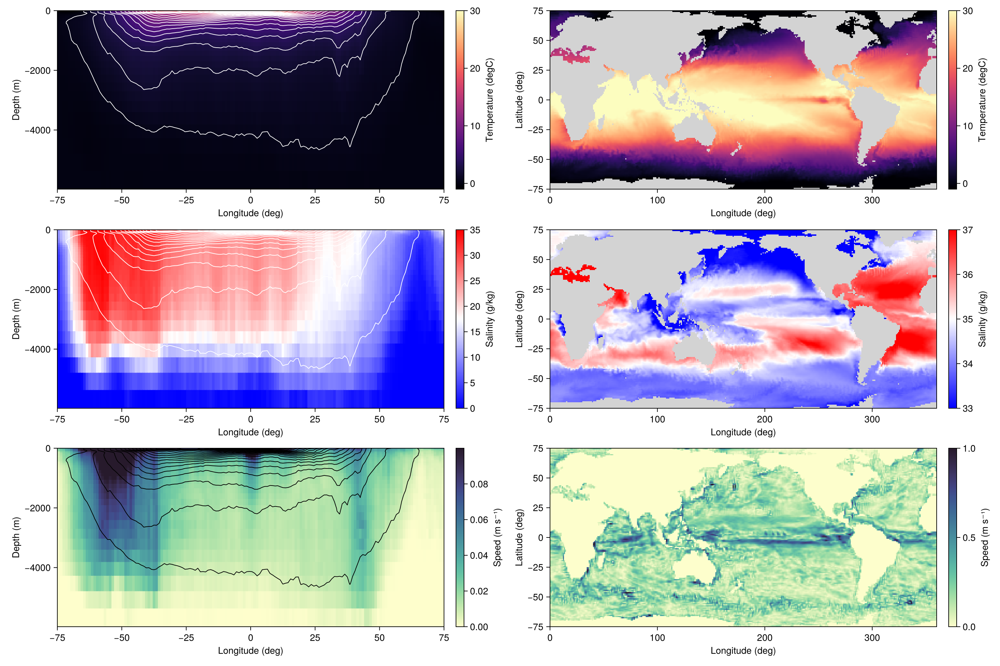

CairoMakie.Screen{IMAGE}


In [9]:
fig = Figure(size = (1500, 1000))

axzonalT = Axis(fig[1, 1], xlabel="Longitude (deg)", ylabel="Depth (m)")
axzonalS = Axis(fig[2, 1], xlabel="Longitude (deg)", ylabel="Depth (m)")
axzonalSp = Axis(fig[3, 1], xlabel="Longitude (deg)", ylabel="Depth (m)")
axsurfT = Axis(fig[1, 3], xlabel="Longitude (deg)", ylabel="Latitude (deg)")
axsurfS = Axis(fig[2, 3], xlabel="Longitude (deg)", ylabel="Latitude (deg)")
axsurfSp = Axis(fig[3, 3], xlabel="Longitude (deg)", ylabel="Latitude (deg)")

hm = heatmap!(axzonalT, φ, z, T_zonal, colorrange = (-1, 30), colormap = :magma, nan_color=:lightgray)
Colorbar(fig[1, 2], hm, label = "Temperature (degC)")
contour!(axzonalT, φ, z, T_zonal, levels = 20, color = :white)  # 10 contour levels

hm = heatmap!(axzonalS, φ, z, S_zonal, colorrange = (0,35), colormap = :bwr, nan_color=:lightgray)
Colorbar(fig[2, 2], hm, label = "Salinity (g/kg)")
contour!(axzonalS, φ, z, T_zonal, levels = 20, color = :white)  # 10 contour levels

hm = heatmap!(axzonalSp, φ, z, sn_zonal, colorrange = (0,0.1), colormap = :deep, nan_color=:lightgray)
Colorbar(fig[3, 2], hm, label = "Speed (m s⁻¹)")
contour!(axzonalSp, φ, z, T_zonal, levels = 20, color = :black)  # 10 contour levels

hm = heatmap!(axsurfT, λ, φ, T_surf, colorrange = (-1, 30), colormap = :magma, nan_color=:lightgray)
Colorbar(fig[1, 4], hm, label = "Temperature (degC)")

hm = heatmap!(axsurfS, λ, φ, S_surf, colorrange = (33,37), colormap = :bwr, nan_color=:lightgray)
Colorbar(fig[2, 4], hm, label = "Salinity (g/kg)")

hm = heatmap!(axsurfSp, λ, φ, sn_surf, colorrange = (0,1), colormap = :deep, nan_color=:lightgray)
Colorbar(fig[3, 4], hm, label = "Speed (m s⁻¹)")

display(fig)

In [10]:
record(fig, experiment_path*"videos/near_global_ocean_zonal.mp4", 1:Nt, framerate = 8) do nn
    n[] = nn
end

"/g/data/v46/txs156/ClimaOcean.jl/examples/videos/near_global_ocean_zonal.mp4"